[View in Colaboratory](https://colab.research.google.com/github/redcican/Coursera_Capstone/blob/master/Battle_of_Neighborhood2_(Week_2).ipynb)

### Please refer to [Google Colab](https://colab.research.google.com/drive/1oUZaN1yvjcn9MOuPa0oTFF1xFkvap1Mf) for a better Visualization of all maps! Thanks 

# Compare the New York City and Toronto based on Venues

# 1. Introduction  

In this Notebook, I will compare the diversity of two very important cities in north America, which is New York city and Toronto. I will first convert addresses into their equivalent latitude and longitude values. Also, I will use the Foursquare API to explore eighborhoods in New York and Toronto. I will use the **explore** function to get the most common venue categories in each neighborhood, and then compare the difference of these two cities. Furthermore, I will use this feature to group the neighborhoods into clusters. I will use the *K-menas* clustering algorithm to complete this task. To visualize the neighborhoods in New York and Toronto and their emerging clusters, I will use the Folium library.

# 2. Import the Libraries

In [1]:
!pip install geopy

    100% |████████████████████████████████| 92kB 3.5MB/s 
  Running setup.py bdist_wheel for geographiclib ... - done
  Stored in directory: /root/.cache/pip/wheels/99/45/d1/14954797e2a976083182c2e7da9b4e924509e59b6e5c661061
Successfully built geographiclib


In [2]:
!pip install folium

    100% |████████████████████████████████| 81kB 3.1MB/s 


In [4]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


# 3. Download and Explore Dataset

The dataset of New York city has a total of 5 boroughs and 306 neighborhoods. In order to segment the neighborhoods and explore them, I will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the latitude and longitude coordinates of each neighborhood.

## 3.1 Grap the New York city Dataset

In [5]:
!wget -q -O 'newyork_data.json' https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json
print('Data downloaded!')

Data downloaded!


In [0]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Notice how all the relevant data is in the features key, which is basically a list of the neighborhoods. So, let's define a new variable that includes this data.

In [0]:
neighborhoods_data = newyork_data['features']

### 3.1.1 Transform the data into a *Pandas* Dataframe

In [0]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
ny_neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    ny_neighborhoods = ny_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [9]:
ny_neighborhoods.head(10)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


And make sure that the dataset has all 5 boroughs and 306 neighborhoods.

In [10]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(ny_neighborhoods['Borough'].unique()),
        ny_neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


For Toronto, we can use the *CSV* file that generated from previous notebook.

## 3.2 Upload the Toronto Dataset

In [11]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving Toronto.csv to Toronto.csv
User uploaded file "Toronto.csv" with length 7874 bytes


In [115]:
tr_neighborhoods = pd.read_csv('Toronto.csv')
tr_neighborhoods.head()

,Postcode,Borough,Neighbourhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Harbourfront, Regent Park",43.654260,-79.360636
3,M6A,North York,"Lawrence Heights, Lawrence Manor",43.718518,-79.464763
4,M7A,Queen's Park,Queen's Park,43.662301,-79.389494


Check the Number of boroughs.

In [13]:
print(f"The number of borough in Toronto is: {len(tr_neighborhoods['Borough'].unique())}")

The number of borough in Toronto is: 11


## 3.3 Geo Coordinates of two cities

Now that we have the dataframe of two cities, we can use **geopy** library to get the latitude and longitude values of two cities. And create a map of two cities wigh neighborhoods superimposed on top.

### 3.3.1 New York City Map

In [14]:
ny_address = 'New York City, NY'

geolocator = Nominatim()
ny_location = geolocator.geocode(ny_address)
ny_latitude = ny_location.latitude
ny_longitude = ny_location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(ny_latitude, ny_longitude))

/usr/local/lib/python3.6/dist-packages/geopy/geocoders/osm.py:143: UserWarning: Using Nominatim with the default "geopy/1.17.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  UserWarning


The geograpical coordinate of New York City are 40.7308619, -73.9871558.


** Create a Map for New York City**

In [15]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[ny_latitude, ny_longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(ny_neighborhoods['Latitude'], ny_neighborhoods['Longitude'], ny_neighborhoods['Borough'], ny_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='fuchsia',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_newyork)  
    
map_newyork

Then we do the same thing for Toronto!

### 3.3.2 Toronto City Map

In [16]:
tr_address = 'Toronto, ON'

geolocator = Nominatim()
tr_location = geolocator.geocode(tr_address)
tr_latitude = tr_location.latitude
tr_longitude = tr_location.longitude
print(f"The geographical coordinate of Toronto are {tr_latitude}, {tr_longitude}")

/usr/local/lib/python3.6/dist-packages/geopy/geocoders/osm.py:143: UserWarning: Using Nominatim with the default "geopy/1.17.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  UserWarning


The geographical coordinate of Toronto are 43.653963, -79.387207


#### Create a Map for Toronto City

In [17]:
# create map of Toronto using latitude and longitude values.
map_toronto = folium.Map(location=[tr_latitude,tr_longitude],zoom_start=10)

# add markers to map
for lat, lng, borough, neighbourhood in zip(tr_neighborhoods['Latitude'],tr_neighborhoods['Longitude'],tr_neighborhoods['Borough'],tr_neighborhoods['Neighbourhood']):
    label = f'{neighbourhood},{borough}'
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius = 5,
        popup = label,
        color = 'navy',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7).add_to(map_toronto)
    
map_toronto

# 4. Use Foursquare AIP to explore the Venues in two cities

#### Define Foursquare Credentials and Version

In [18]:
CLIENT_ID = 'JMEUHCFMSELYYLQVNQYWWM0B332QF0W13WIKM5XEBWZ53E23' # your Foursquare ID
CLIENT_SECRET = 'UC0SEMTM0Z52F543R2Z1P2PP1RW4JVSXDVQ41QO44YHUGTJ1' # your Foursquare Secret
VERSION = '20181020' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: JMEUHCFMSELYYLQVNQYWWM0B332QF0W13WIKM5XEBWZ53E23
CLIENT_SECRET:UC0SEMTM0Z52F543R2Z1P2PP1RW4JVSXDVQ41QO44YHUGTJ1


In [0]:
LIMIT = 1000
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    ny_latitude, 
   ny_longitude,  
   LIMIT)

In [0]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

## 4.1 Explore the all neighborhoods in New York City


In [0]:
def getNearbyVenues(names, latitudes, longitudes):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [56]:
newyork_venues = getNearbyVenues(names=ny_neighborhoods['Neighborhood'],
                                  latitudes=ny_neighborhoods['Latitude'],
                                  longitudes=ny_neighborhoods['Longitude'])

Wakefield
Co-op City
Eastchester
Fieldston
Riverdale
Kingsbridge
Marble Hill
Woodlawn
Norwood
Williamsbridge
Baychester
Pelham Parkway
City Island
Bedford Park
University Heights
Morris Heights
Fordham
East Tremont
West Farms
High  Bridge
Melrose
Mott Haven
Port Morris
Longwood
Hunts Point
Morrisania
Soundview
Clason Point
Throgs Neck
Country Club
Parkchester
Westchester Square
Van Nest
Morris Park
Belmont
Spuyten Duyvil
North Riverdale
Pelham Bay
Schuylerville
Edgewater Park
Castle Hill
Olinville
Pelham Gardens
Concourse
Unionport
Edenwald
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker

Check the size of resulting dataframe.

In [53]:
print(newyork_venues.shape)
newyork_venues.head(10)

(30362, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,Kingston Tropical Bakery,40.888568,-73.859885,Bakery
5,Wakefield,40.894705,-73.847201,Bx Uptown Caribbean Taste,40.890178,-73.859224,Caribbean Restaurant
6,Wakefield,40.894705,-73.847201,Jimbo's,40.891740,-73.858226,Burger Joint
7,Wakefield,40.894705,-73.847201,Rite Aid,40.896521,-73.844680,Pharmacy
8,Wakefield,40.894705,-73.847201,Mario's Pizza,40.888628,-73.831260,Pizza Place
9,Wakefield,40.894705,-73.847201,Katonah Pizza and Pasta,40.898784,-73.867457,Pizza Place


Save as CSV file for reusing.

In [0]:
newyork_venues.to_csv('newyork_venues.csv',index=False)

Download to local Disk!

In [0]:
from google.colab import files

files.download('newyork_venues.csv')

Check the unique category.

In [60]:
print('There are {} uniques categories.'.format(len(newyork_venues['Venue Category'].unique())))

There are 443 uniques categories.


## 4.2 Explore the all neighborhoods in Toronto City

In [62]:
toronto_venues = getNearbyVenues(names=tr_neighborhoods['Neighbourhood'],
                                  latitudes=tr_neighborhoods['Latitude'],
                                  longitudes=tr_neighborhoods['Longitude'])

Parkwoods
Victoria Village
Harbourfront, Regent Park
Lawrence Heights, Lawrence Manor
Queen's Park
Islington Avenue
Rouge, Malvern
Don Mills North
Woodbine Gardens, Parkview Hill
Ryerson, Garden District
Glencairn
Cloverdale, Islington, Martin Grove, Princess Gardens, West Deane Park
Highland Creek, Rouge Hill, Port Union
Flemingdon Park, Don Mills South
Woodbine Heights
St. James Town
Humewood-Cedarvale
Bloordale Gardens, Eringate, Markland Wood, Old Burnhamthorpe
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Downsview North, Wilson Heights
Thorncliffe Park
Adelaide, King, Richmond
Dovercourt Village, Dufferin
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
East Toronto
Harbourfront East, Toronto Islands, Union Station
Little Portugal, Trinity
East Birchmount Park, Ionview, Kennedy Park
Bayview Village
CFB Toronto, Downsview East
The D

In [54]:
print(toronto_venues.shape)
toronto_venues.head(10)

(10187, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Parkwoods,43.753259,-79.329656,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,Parkwoods,43.753259,-79.329656,Darband Restaurant,43.755194,-79.348498,Middle Eastern Restaurant
2,Parkwoods,43.753259,-79.329656,Donalda Golf & Country Club,43.752816,-79.342741,Golf Course
3,Parkwoods,43.753259,-79.329656,LA Fitness,43.747665,-79.347077,Gym / Fitness Center
4,Parkwoods,43.753259,-79.329656,Galleria Supermarket,43.753520,-79.349518,Supermarket
5,Parkwoods,43.753259,-79.329656,Island Foods,43.745866,-79.346035,Caribbean Restaurant
6,Parkwoods,43.753259,-79.329656,Graydon Hall Manor,43.763923,-79.342961,Event Space
7,Parkwoods,43.753259,-79.329656,Damas Grillhouse & Juice Bar,43.741839,-79.309296,Mediterranean Restaurant
8,Parkwoods,43.753259,-79.329656,Spoon And Fork Plus,43.754862,-79.349616,Japanese Restaurant
9,Parkwoods,43.753259,-79.329656,North Beach Indoor Volleyball Academy,43.737191,-79.323714,Gym / Fitness Center


In [0]:
toronto_venues.to_csv('toronto_venues.csv',index=False)

In [0]:
from google.colab import files

files.download('toronto_venues.csv')

In [66]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 322 uniques categories.


# 5. Exploratory Data Analysis of Venues in two Cities

Read the two csv files.

In [22]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving newyork_venues.csv to newyork_venues.csv
User uploaded file "newyork_venues.csv" with length 3509579 bytes


In [24]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving toronto_venues.csv to toronto_venues.csv
User uploaded file "toronto_venues.csv" with length 1278049 bytes


#### Check the Top 10 Venues Categories in two cities

In [0]:
newyork_venues = pd.read_csv('newyork_venues.csv')
toronto_venues = pd.read_csv('toronto_venues.csv')

In [89]:
newyork_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,40.889283,-73.843310,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Ali's Roti Shop,40.894036,-73.856935,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,Kingston Tropical Bakery,40.888568,-73.859885,Bakery


## 5.1 Compare the top 10 Venues in two cities

Text(0.5,1,'Top 10 Venues in New York City')

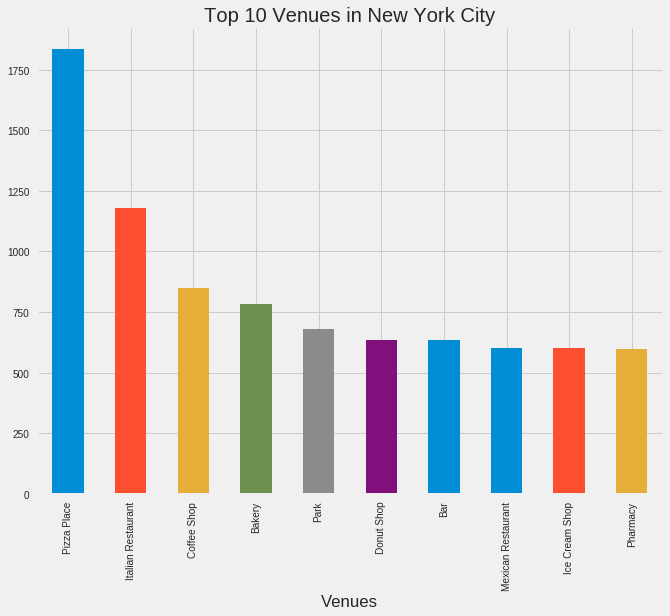

In [27]:
plt.figure(figsize=(10,8))
newyork_venues['Venue Category'].value_counts().nlargest(10).plot(kind='bar')
plt.xlabel('Venues')
plt.title('Top 10 Venues in New York City')

Convert the top 10 Venues in New York to Dataframe

In [28]:
top10_ny_venues = newyork_venues['Venue Category'].value_counts().nlargest(10).to_frame().reset_index()
top10_ny_venues.columns = ['Venues', 'Counts']
top10_ny_venues

,Venues,Counts
0,Pizza Place,1833
1,Italian Restaurant,1181
2,Coffee Shop,850
3,Bakery,781
4,Park,680
5,Donut Shop,635
6,Bar,633
7,Mexican Restaurant,600
8,Ice Cream Shop,600
9,Pharmacy,598


Let's check the top 10 venues in Toronto.

Text(0.5,1,'Top 10 Venues in Toronto City')

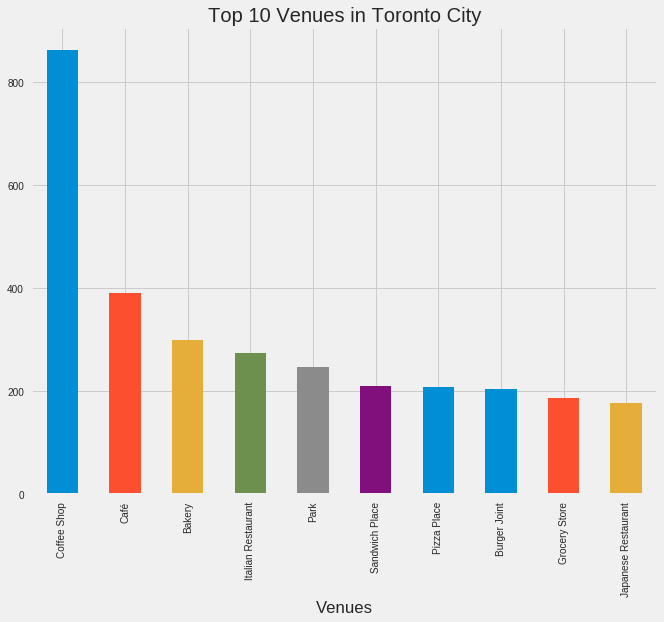

In [29]:
plt.figure(figsize=(10,8))
toronto_venues['Venue Category'].value_counts().nlargest(10).plot(kind='bar')
plt.xlabel('Venues')
plt.title('Top 10 Venues in Toronto City')

In [30]:
top10_tr_venues = toronto_venues['Venue Category'].value_counts().nlargest(10).to_frame().reset_index()
top10_tr_venues.columns = ['Venues', 'Counts']
top10_tr_venues

,Venues,Counts
0,Coffee Shop,863
1,Café,391
2,Bakery,298
3,Italian Restaurant,273
4,Park,247
5,Sandwich Place,210
6,Pizza Place,208
7,Burger Joint,204
8,Grocery Store,186
9,Japanese Restaurant,177


#### Compare the two plots and dataframes, we found that New York city is significantly 'larger' than Toronto since the density of Venues in New York in much larger than in Toronto. Interestingly, the most venues are about *Catering*, so two cities in some ways are quite similar to each other.

Notice that for both cities, Italien Restaurants are very popular, we can explore more information about that!

## 5.2 Compare the Italien Restaurants in two cities

### 5.2.1 Explore the Italian Restaurants in New York City

In [36]:
search_query = 'Italian'
radius = 1000
print(search_query + ' .... OK!') 

Italian .... OK!


In [37]:
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, ny_latitude, ny_longitude, VERSION, search_query, radius, LIMIT)
url

'https://api.foursquare.com/v2/venues/search?client_id=JMEUHCFMSELYYLQVNQYWWM0B332QF0W13WIKM5XEBWZ53E23&client_secret=UC0SEMTM0Z52F543R2Z1P2PP1RW4JVSXDVQ41QO44YHUGTJ1&ll=40.7308619,-73.9871558&v=20181020&query=Italian&radius=1000&limit=1000'

In [38]:
ny_results = requests.get(url).json()
ny_results

{'meta': {'code': 200, 'requestId': '5bcb6a8f1ed219428829138b'},
 'response': {'venues': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_',
       'suffix': '.png'},
      'id': '4bf58dd8d48988d110941735',
      'name': 'Italian Restaurant',
      'pluralName': 'Italian Restaurants',
      'primary': True,
      'shortName': 'Italian'}],
    'hasPerk': False,
    'id': '58dd8ac3a8b75966fda9a547',
    'location': {'address': '345 E 6th St',
     'cc': 'US',
     'city': 'New York',
     'country': 'United States',
     'crossStreet': '1st and 2nd Ave',
     'distance': 482,
     'formattedAddress': ['345 E 6th St (1st and 2nd Ave)',
      'New York, NY 10003',
      'United States'],
     'labeledLatLngs': [{'label': 'display',
       'lat': 40.726556174383305,
       'lng': -73.98651414092868}],
     'lat': 40.726556174383305,
     'lng': -73.98651414092868,
     'postalCode': '10003',
     'state': 'NY'},
    'name': 'Tableside Italian Cook Sh

In [39]:
# assign relevant part of JSON to venues
ny_it_venues = ny_results['response']['venues']

# tranform venues into a dataframe
ny_it_dataframe = json_normalize(ny_it_venues)
ny_it_dataframe.head()

,categories,delivery.id,delivery.provider.icon.name,delivery.provider.icon.prefix,delivery.provider.icon.sizes,delivery.provider.name,delivery.url,hasPerk,id,location.address,location.cc,location.city,location.country,location.crossStreet,location.distance,location.formattedAddress,location.labeledLatLngs,location.lat,location.lng,location.postalCode,location.state,name,referralId,venuePage.id
0,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",NaN,NaN,NaN,NaN,NaN,NaN,False,58dd8ac3a8b75966fda9a547,345 E 6th St,US,New York,United States,1st and 2nd Ave,482,"[345 E 6th St (1st and 2nd Ave), New York, NY ...","[{'label': 'display', 'lat': 40.72655617438330...",40.726556,-73.986514,10003,NY,Tableside Italian Cook Shoppe,v-1540057743,427907002
1,"[{'id': '4bf58dd8d48988d119951735', 'name': 'W...",NaN,NaN,NaN,NaN,NaN,NaN,False,4b047a7bf964a5207f5422e3,108 E 16th St,US,New York,United States,btwn Union Square E & Irving Pl,561,[108 E 16th St (btwn Union Square E & Irving P...,"[{'label': 'display', 'lat': 40.73573813168210...",40.735738,-73.988858,10003,NY,Italian Wine Merchants,v-1540057743,NaN
2,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",NaN,NaN,NaN,NaN,NaN,NaN,False,4d49d00ef53c8cfa78561c47,251 E Houston St,US,New York,United States,at Norfolk St,1001,"[251 E Houston St (at Norfolk St), New York, N...","[{'label': 'display', 'lat': 40.72195968380544...",40.721960,-73.985400,10002,NY,Gaia Italian Cafe,v-1540057743,133588472
3,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",NaN,NaN,NaN,NaN,NaN,NaN,False,4bca330368f976b0fce75e83,13th Street,US,New York,United States,Third Avenue,237,"[13th Street (Third Avenue), New York, NY 1000...","[{'label': 'display', 'lat': 40.732834, 'lng':...",40.732834,-73.988219,10003,NY,Italian Sparkle Palace,v-1540057743,NaN
4,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",NaN,NaN,NaN,NaN,NaN,NaN,False,51dccc59498ed4c3651a098c,Hester St,US,New York,United States,Mulberry,156,"[Hester St (Mulberry), New York, NY, United St...","[{'label': 'display', 'lat': 40.73225635600397...",40.732256,-73.987413,NaN,NY,Lusterini Italian Restaurant,v-1540057743,NaN


#### Define information of interest and filter dataframe

In [40]:
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in ny_it_dataframe.columns if col.startswith('location.')] + ['id']
dataframe_filtered = ny_it_dataframe.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

dataframe_filtered

,name,categories,address,cc,city,country,crossStreet,distance,formattedAddress,labeledLatLngs,lat,lng,postalCode,state,id
0,Tableside Italian Cook Shoppe,Italian Restaurant,345 E 6th St,US,New York,United States,1st and 2nd Ave,482,"[345 E 6th St (1st and 2nd Ave), New York, NY ...","[{'label': 'display', 'lat': 40.72655617438330...",40.726556,-73.986514,10003,NY,58dd8ac3a8b75966fda9a547
1,Italian Wine Merchants,Wine Shop,108 E 16th St,US,New York,United States,btwn Union Square E & Irving Pl,561,[108 E 16th St (btwn Union Square E & Irving P...,"[{'label': 'display', 'lat': 40.73573813168210...",40.735738,-73.988858,10003,NY,4b047a7bf964a5207f5422e3
2,Gaia Italian Cafe,Italian Restaurant,251 E Houston St,US,New York,United States,at Norfolk St,1001,"[251 E Houston St (at Norfolk St), New York, N...","[{'label': 'display', 'lat': 40.72195968380544...",40.721960,-73.985400,10002,NY,4d49d00ef53c8cfa78561c47
3,Italian Sparkle Palace,Italian Restaurant,13th Street,US,New York,United States,Third Avenue,237,"[13th Street (Third Avenue), New York, NY 1000...","[{'label': 'display', 'lat': 40.732834, 'lng':...",40.732834,-73.988219,10003,NY,4bca330368f976b0fce75e83
4,Lusterini Italian Restaurant,Italian Restaurant,Hester St,US,New York,United States,Mulberry,156,"[Hester St (Mulberry), New York, NY, United St...","[{'label': 'display', 'lat': 40.73225635600397...",40.732256,-73.987413,NaN,NY,51dccc59498ed4c3651a098c
5,Johnny Mozzarella's Italian Eatery and Cafe,Food,328 E 14th St,US,New York,United States,NaN,350,"[328 E 14th St, New York, NY 10003, United Sta...","[{'label': 'display', 'lat': 40.731577, 'lng':...",40.731577,-73.983114,10003,NY,4f328c7c19836c91c7e299c5
6,Gemma,Italian Restaurant,335 Bowery,US,New York,United States,btwn E 2nd & E 3rd St,645,"[335 Bowery (btwn E 2nd & E 3rd St), New York,...",NaN,40.726234,-73.991769,10003,NY,46e7a0caf964a520ca4a1fe3
7,Johns Italian,Italian Restaurant,NaN,US,New York,United States,NaN,603,"[New York, NY, United States]","[{'label': 'display', 'lat': 40.72907466515201...",40.729075,-73.980400,NaN,NY,52e86ddc11d22d8bdf11e4d7
8,La Bella Italian Restaurant,Italian Restaurant,349 E 12th St,US,New York,United States,NaN,847,"[349 E 12th St, New York, NY 10003, United Sta...","[{'label': 'display', 'lat': 40.7271, 'lng': -...",40.727100,-73.978417,10003,NY,4f32225819836c91c7b97517
9,Modern Kitchen Design Cabinets | Cesar NYC,Business Service,50 W 23rd St,US,New York,United States,NaN,61,"[50 W 23rd St, New York, NY 10010, United States]","[{'label': 'display', 'lat': 40.73034831215804...",40.730348,-73.987427,10010,NY,574c24f9498e3a7d0efcd58c


#### Let's visualize the Italian restaurants that are nearby

In [41]:
dataframe_filtered.name

0                   Tableside Italian Cook Shoppe
1                          Italian Wine Merchants
2                               Gaia Italian Cafe
3                          Italian Sparkle Palace
4                    Lusterini Italian Restaurant
5     Johnny Mozzarella's Italian Eatery and Cafe
6                                           Gemma
7                                   Johns Italian
8                     La Bella Italian Restaurant
9      Modern Kitchen Design Cabinets | Cesar NYC
10                      Corner Stone Italian Cafe
11        West Village Italian-Cajun Pizza Parlor
12                       V Artisanal Italian Wine
13                       Russo Mozzarella & Pasta
14                              Frank's Trattoria
15                          Italiano Cooper Union
16                       Gelato Classica Italiana
17                                         Gene's
18                              il gusto italiano
19                              NYU Casa Italiana


In [47]:
# create map of New York using latitude and longitude values
ny_it_map = folium.Map(location=[ny_latitude, ny_longitude], zoom_start=14)

# add markers to map
for lat, lng, borough, neighborhood in zip(ny_neighborhoods['Latitude'], ny_neighborhoods['Longitude'], ny_neighborhoods['Borough'], ny_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(ny_it_map)  
    

# add the Italian restaurants as blue circle markers
for lat, lng, label in zip(dataframe_filtered.lat, dataframe_filtered.lng, dataframe_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=8,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(ny_it_map)

# display map
ny_it_map

Let's try to get the rating of all these 21 Italien Restaurants.

In [57]:
venue_ids = list(dataframe_filtered['id'])
ny_it_rate = []

for venue_id in venue_ids:
    url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
    result = requests.get(url).json()
    try:
        print(result['response']['venue']['rating'])
        ny_it_rate.append(result['response']['venue']['rating'])
    except:
        print('This venue has not been rated yet.')

7.4
9.1
9.3
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
8.8
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
9.2
8.1
This venue has not been rated yet.
This venue has not been rated yet.
8.7
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.


There are many Italien Restaurants are not rated. We can find the best rated Restaurants and the mean rating.

In [63]:
print(f"The best rated Italian Restaurants in New York city is Italian Sparkle Palace, and it's rating is {max(ny_it_rate)}")
print(f"The mean rating of Italian Restaurants in New York city is: {np.mean(ny_it_rate):.2f}")

The best rated Italian Restaurants in New York city is Italian Sparkle Palace, and it's rating is 9.3
The mean rating of Italian Restaurants in New York city is: 8.66


### 5.2.2 Explore the Italian Restaurants in Toronto city

In [64]:
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, tr_latitude, tr_longitude, VERSION, search_query, radius, LIMIT)
url

'https://api.foursquare.com/v2/venues/search?client_id=JMEUHCFMSELYYLQVNQYWWM0B332QF0W13WIKM5XEBWZ53E23&client_secret=UC0SEMTM0Z52F543R2Z1P2PP1RW4JVSXDVQ41QO44YHUGTJ1&ll=43.653963,-79.387207&v=20181020&query=Italian&radius=1000&limit=1000'

In [0]:
tr_results = requests.get(url).json()

In [66]:
# assign relevant part of JSON to venues
tr_it_venues = tr_results['response']['venues']

# tranform venues into a dataframe
tr_it_dataframe = json_normalize(tr_it_venues)
tr_it_dataframe.head()

,categories,hasPerk,id,location.address,location.cc,location.city,location.country,location.crossStreet,location.distance,location.formattedAddress,location.labeledLatLngs,location.lat,location.lng,location.postalCode,location.state,name,referralId,venuePage.id
0,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",False,52f6816f11d24a43115dc834,382 Yonge St. Unit #7,CA,Toronto,Canada,Gerrard,652,"[382 Yonge St. Unit #7 (Gerrard), Toronto ON M...","[{'label': 'display', 'lat': 43.65892029202872...",43.658920,-79.382891,M5B 1S8,ON,Scaddabush Italian Kitchen & Bar,v-1540059051,NaN
1,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",False,5b897e92db1d81002c91df8c,66 Wellington St W,CA,Toronto,Canada,NaN,877,"[66 Wellington St W, Toronto ON M5K 1E7, Canada]","[{'label': 'display', 'lat': 43.647161, 'lng':...",43.647161,-79.381691,M5K 1E7,ON,Fabbrica Rustic Italian,v-1540059051,NaN
2,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",False,51bf3866498e55ee55df8db0,NaN,CA,Toronto,Canada,NaN,127,"[Toronto ON, Canada]","[{'label': 'display', 'lat': 43.65499143746528...",43.654991,-79.387897,NaN,ON,The Fresh Italian,v-1540059051,NaN
3,"[{'id': '4bf58dd8d48988d110941735', 'name': 'I...",False,526fe29411d2aeb3803013b0,"109 McCaul Street, Unit #42",CA,Toronto,Canada,Dundas Street West,288,"[109 McCaul Street, Unit #42 (Dundas Street We...","[{'label': 'display', 'lat': 43.653889, 'lng':...",43.653889,-79.390785,M5T 3K5,ON,The Fresh Italian Eatery,v-1540059051,NaN
4,"[{'id': '4bf58dd8d48988d12c951735', 'name': 'E...",False,4bfc0289c3ba9521c00f9653,136 Beverley St,CA,Toronto,Canada,Dundas Street,555,"[136 Beverley St (Dundas Street), Toronto ON, ...","[{'label': 'display', 'lat': 43.65402694219784...",43.654027,-79.394104,NaN,ON,Italian Consulate Toronto,v-1540059051,NaN


In [67]:
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in tr_it_dataframe.columns if col.startswith('location.')] + ['id']
tr_dataframe_filtered = tr_it_dataframe.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
tr_dataframe_filtered['categories'] = tr_dataframe_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
tr_dataframe_filtered.columns = [column.split('.')[-1] for column in tr_dataframe_filtered.columns]

tr_dataframe_filtered

,name,categories,address,cc,city,country,crossStreet,distance,formattedAddress,labeledLatLngs,lat,lng,postalCode,state,id
0,Scaddabush Italian Kitchen & Bar,Italian Restaurant,382 Yonge St. Unit #7,CA,Toronto,Canada,Gerrard,652,"[382 Yonge St. Unit #7 (Gerrard), Toronto ON M...","[{'label': 'display', 'lat': 43.65892029202872...",43.658920,-79.382891,M5B 1S8,ON,52f6816f11d24a43115dc834
1,Fabbrica Rustic Italian,Italian Restaurant,66 Wellington St W,CA,Toronto,Canada,NaN,877,"[66 Wellington St W, Toronto ON M5K 1E7, Canada]","[{'label': 'display', 'lat': 43.647161, 'lng':...",43.647161,-79.381691,M5K 1E7,ON,5b897e92db1d81002c91df8c
2,The Fresh Italian,Italian Restaurant,NaN,CA,Toronto,Canada,NaN,127,"[Toronto ON, Canada]","[{'label': 'display', 'lat': 43.65499143746528...",43.654991,-79.387897,NaN,ON,51bf3866498e55ee55df8db0
3,The Fresh Italian Eatery,Italian Restaurant,"109 McCaul Street, Unit #42",CA,Toronto,Canada,Dundas Street West,288,"[109 McCaul Street, Unit #42 (Dundas Street We...","[{'label': 'display', 'lat': 43.653889, 'lng':...",43.653889,-79.390785,M5T 3K5,ON,526fe29411d2aeb3803013b0
4,Italian Consulate Toronto,Embassy / Consulate,136 Beverley St,CA,Toronto,Canada,Dundas Street,555,"[136 Beverley St (Dundas Street), Toronto ON, ...","[{'label': 'display', 'lat': 43.65402694219784...",43.654027,-79.394104,NaN,ON,4bfc0289c3ba9521c00f9653
5,Mustachio Italian Eatery,Italian Restaurant,595 Bay St,CA,Toronto,Canada,Dundas St,405,"[595 Bay St (Dundas St), Toronto ON M5G 2C2, C...","[{'label': 'display', 'lat': 43.65616, 'lng': ...",43.656160,-79.383190,M5G 2C2,ON,573df789498e03dd8e54b166
6,LA's Italian + Bar,Italian Restaurant,NaN,CA,NaN,Canada,NaN,434,[Canada],"[{'label': 'display', 'lat': 43.65053979517576...",43.650540,-79.384603,NaN,NaN,4f88cf84e4b002b90ab3b9b9
7,Classic italian style pizza food truck,Food Truck,CNE Midway,CA,Toronto,Canada,NaN,530,"[CNE Midway, Toronto ON, Canada]","[{'label': 'display', 'lat': 43.652144, 'lng':...",43.652144,-79.381118,NaN,ON,4c787c9181bca0936180fa14
8,john's italian cafe,Italian Restaurant,27 Baldwin Street,CA,Toronto,Canada,NaN,546,"[27 Baldwin Street, Toronto ON, Canada]","[{'label': 'display', 'lat': 43.65612672798775...",43.656127,-79.393301,NaN,ON,53daae5b498e9c9597c19b23
9,Corrado's Greek & Italian Cuisine,Souvlaki Shop,118 John Street,CA,Toronto,Canada,Adelaide St W,685,"[118 John Street (Adelaide St W), Toronto ON M...","[{'label': 'display', 'lat': 43.64825928375563...",43.648259,-79.390423,M5V 2E2,ON,5554e4c6498e974bfaf41b5b


In [68]:
tr_dataframe_filtered.name

0           Scaddabush Italian Kitchen & Bar
1                    Fabbrica Rustic Italian
2                          The Fresh Italian
3                   The Fresh Italian Eatery
4                  Italian Consulate Toronto
5                   Mustachio Italian Eatery
6                         LA's Italian + Bar
7     Classic italian style pizza food truck
8                        john's italian cafe
9          Corrado's Greek & Italian Cuisine
10               Kit Kat Italian Bar & Grill
11                                    Sbarro
12                          Little Anthony's
13    Joe Badali's Ristorante Italiano & Bar
14                                Sauté Rosé
15                        Consolato Italiano
Name: name, dtype: object

In [69]:
# create map of Toronto using latitude and longitude values
tr_it_map = folium.Map(location=[tr_latitude, tr_longitude], zoom_start=14)

# add markers to map
for lat, lng, borough, neighborhood in zip(tr_neighborhoods['Latitude'], tr_neighborhoods['Longitude'], tr_neighborhoods['Borough'], tr_neighborhoods['Neighbourhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(tr_it_map)  
    

# add the Italian restaurants as blue circle markers
for lat, lng, label in zip(tr_dataframe_filtered.lat, tr_dataframe_filtered.lng, tr_dataframe_filtered.categories):
    folium.CircleMarker(
        [lat, lng],
        radius=8,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(tr_it_map)

# display map
tr_it_map

Let's try to get the rating of all these 16 Italien Restaurants.

In [70]:
tr_venue_ids = list(tr_dataframe_filtered['id'])
tr_it_rate = []

for venue_id in tr_venue_ids:
    url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(venue_id, CLIENT_ID, CLIENT_SECRET, VERSION)
    result = requests.get(url).json()
    try:
        print(result['response']['venue']['rating'])
        ny_it_rate.append(result['response']['venue']['rating'])
    except:
        print('This venue has not been rated yet.')

8.1
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.
This venue has not been rated yet.


Since there is only one Restaurant was rated, the comparion of two cities are meaningless.

# 6. Analyze Each Neighborhood in two cities

In [90]:
print('There are {} uniques categories.'.format(len(newyork_venues['Venue Category'].unique())))

There are 443 uniques categories.


## 6.1 Analyze the New York City

In [73]:
# one hot encoding
newyork_onehot = pd.get_dummies(newyork_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
newyork_onehot['Neighborhood'] = newyork_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [newyork_onehot.columns[-1]] + list(newyork_onehot.columns[:-1])
newyork_onehot = newyork_onehot[fixed_columns]

newyork_onehot.head()

,Zoo Exhibit,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Leather Goods Store,Lebanese Restaurant,Library,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Modern Greek Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Multiplex,Museum,Mu

And let's examine the new dataframe size.

In [74]:
newyork_onehot.shape

(30362, 443)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [95]:
newyork_grouped = newyork_onehot.groupby('Neighborhood').mean().reset_index()
newyork_grouped

,Neighborhood,Zoo Exhibit,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auditorium,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Car Wash,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College Academic Building,College Arts Building,College Basketball Court,College Bookstore,College Cafeteria,College Gym,College Theater,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Czech Restaurant,Dance Studio,Daycare,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Duty-free Shop,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Heliport,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Leather Goods Store,Lebanese Restaurant,Library,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Memorial Site,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Modern Greek Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Multip

#### Let's confirm the new size

In [96]:
newyork_grouped.shape

(302, 443)

#### Let's print each neighborhood along with the top 5 most common venues

In [77]:
num_top_venues = 5

for hood in newyork_grouped['Neighborhood'][:10]:
    print("----"+hood+"----")
    temp = newyork_grouped[newyork_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Allerton----
                  venue  freq
0           Pizza Place  0.12
1                Garden  0.08
2            Donut Shop  0.07
3  Caribbean Restaurant  0.05
4    Italian Restaurant  0.04


----Annadale----
                venue  freq
0  Italian Restaurant  0.11
1         Pizza Place  0.11
2      Ice Cream Shop  0.07
3          Bagel Shop  0.04
4              Bakery  0.04


----Arden Heights----
                venue  freq
0  Italian Restaurant  0.10
1         Pizza Place  0.08
2      Ice Cream Shop  0.06
3         Coffee Shop  0.05
4    Sushi Restaurant  0.05


----Arlington----
            venue  freq
0  Clothing Store  0.09
1     Pizza Place  0.04
2  Ice Cream Shop  0.04
3           Hotel  0.03
4      Bagel Shop  0.03


----Arrochar----
                venue  freq
0  Italian Restaurant  0.16
1         Pizza Place  0.08
2               Beach  0.06
3            Pharmacy  0.04
4                 Bar  0.04


----Arverne----
                venue  freq
0               Beach  0.30

#### Let's put that into a *pandas* dataframe

In [0]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [80]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
ny_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
ny_neighborhoods_venues_sorted['Neighborhood'] = newyork_grouped['Neighborhood']

for ind in np.arange(newyork_grouped.shape[0]):
    ny_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(newyork_grouped.iloc[ind, :], num_top_venues)

ny_neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Pizza Place,Garden,Donut Shop,Caribbean Restaurant,Italian Restaurant,Chinese Restaurant,Coffee Shop,Botanical Garden,Pharmacy,Diner
1,Annadale,Italian Restaurant,Pizza Place,Ice Cream Shop,Park,Gym / Fitness Center,Diner,Bagel Shop,Bakery,Restaurant,Pharmacy
2,Arden Heights,Italian Restaurant,Pizza Place,Ice Cream Shop,Coffee Shop,Diner,Sushi Restaurant,Bakery,Donut Shop,Bagel Shop,Pharmacy
3,Arlington,Clothing Store,Pizza Place,Ice Cream Shop,Italian Restaurant,Bagel Shop,Department Store,Hotel,American Restaurant,Lingerie Store,Deli / Bodega
4,Arrochar,Italian Restaurant,Pizza Place,Beach,Pharmacy,Bar,Sandwich Place,Bank,Bagel Shop,Restaurant,Mexican Restaurant
5,Arverne,Beach,Bagel Shop,Surf Spot,Airport Lounge,Pizza Place,Burger Joint,Italian Restaurant,Donut Shop,Beach Bar,Golf Course
6,Astoria,Bar,Bakery,Greek Restaurant,Pizza Place,Grocery Store,Seafood Restaurant,Italian Restaurant,Middle Eastern Restaurant,Hookah Bar,Coffee Shop
7,Astoria Heights,Bakery,Pizza Place,Bar,Sushi Restaurant,Deli / Bodega,Greek Restaurant,Gym / Fitness Center,Italian Restaurant,Bagel Shop,Dessert Shop
8,Auburndale,Korean Restaurant,Bakery,Pizza Place,Greek Restaurant,Pharmacy,Ice Cream Shop,Café,Bagel Shop,Cosmetics Shop,Coffee Shop
9,Bath Beach,Pizza Place,Bakery,Italian Restaurant,Park,Deli / Bodega,Sushi Restaurant,Pharmacy,Coffee Shop,Ice Cream Shop,Donut Shop


## 6.2 Clustering the New York City Venues

Run *k*-means to cluster the neighborhood into 10 clusters.

In [91]:
# set number of clusters
kclusters = 10

newyork_grouped_clustering = newyork_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(newyork_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([8, 0, 0, 3, 4, 2, 7, 3, 9, 0], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [109]:
ny_neighborhoods_1 = ny_neighborhoods.drop_duplicates(subset=['Neighborhood'],keep='first')
ny_neighborhoods_1.shape

(302, 4)

In [110]:
newyork_merged = ny_neighborhoods_1

# add clustering labels
newyork_merged['Cluster Labels'] = kmeans.labels_

# merge newyork_grouped with toronto_data to add latitude/longitude for each neighborhood
newyork_merged = newyork_merged.join(ny_neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

newyork_merged.head() # check the last columns!

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bronx,Wakefield,40.894705,-73.847201,8,Caribbean Restaurant,Pharmacy,Pizza Place,Bakery,Donut Shop,Discount Store,Diner,Supermarket,Grocery Store,Pub
1,Bronx,Co-op City,40.874294,-73.829939,0,Caribbean Restaurant,Pizza Place,Fast Food Restaurant,Discount Store,Pharmacy,Italian Restaurant,Donut Shop,Shopping Mall,Bakery,Grocery Store
2,Bronx,Eastchester,40.887556,-73.827806,0,Caribbean Restaurant,Pharmacy,Pizza Place,Shopping Mall,Discount Store,Bakery,Ice Cream Shop,Fast Food Restaurant,Grocery Store,Burger Joint
3,Bronx,Fieldston,40.895437,-73.905643,3,Pizza Place,Bar,Mexican Restaurant,Sandwich Place,Coffee Shop,Donut Shop,Burger Joint,Italian Restaurant,Park,Bakery
4,Bronx,Riverdale,40.890834,-73.912585,4,Pizza Place,Mexican Restaurant,Bar,Park,Burger Joint,Donut Shop,Coffee Shop,Scenic Lookout,Sandwich Place,Bakery


Finally, let's visualize the resulting clusters




In [111]:
# create map
ny_map_clusters = folium.Map(location=[ny_latitude, ny_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(newyork_merged['Latitude'], newyork_merged['Longitude'], newyork_merged['Neighborhood'], newyork_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(ny_map_clusters)
       
ny_map_clusters

<br>

<br>

## 6.3 Analyze the Toronto City

In [118]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Zoo Exhibit,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Beach,Beach Bar,Beer Bar,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Campground,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Castle,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Churrascaria,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Rec Center,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hong Kong Restaurant,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Hungarian Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Noodle House,Nudist Beach,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Outdoor Supply Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pide Place,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Pub,Racecourse,Racetrack,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Restaurant,Rock Climbing Spot,Rock Club,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Science Museum,Sculpture Garden,Seafood Restaurant,Shoe Repair,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Ski Area,Ski Chalet,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Spo

In [120]:
toronto_onehot.shape

(10187, 322)

In [121]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped.shape

(103, 322)

In [0]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
tr_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
tr_neighborhoods_venues_sorted['Neighborhood'] = toronto_grouped['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    tr_neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

## 6.4 Clustering the Toronto City Venues

In [123]:
# set number of clusters
kclusters = 10

toronto_grouped_clustering = toronto_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 3, 3, 5, 4, 1, 2, 7, 0, 6], dtype=int32)

In [125]:
toronto_merged = tr_neighborhoods

# add clustering labels
toronto_merged['Cluster Labels'] = kmeans.labels_

# merge newyork_grouped with toronto_data to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(tr_neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighbourhood')

toronto_merged.head() # check the last columns!

,Postcode,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,M3A,North York,Parkwoods,43.753259,-79.329656,0,Middle Eastern Restaurant,Coffee Shop,Burger Joint,Supermarket,Japanese Restaurant,Gym / Fitness Center,Café,Mediterranean Restaurant,Bakery,Steakhouse
1,M4A,North York,Victoria Village,43.725882,-79.315572,3,Middle Eastern Restaurant,Coffee Shop,Burger Joint,Japanese Restaurant,Grocery Store,Supermarket,Movie Theater,Gym / Fitness Center,Ice Cream Shop,Burrito Place
2,M5A,Downtown Toronto,"Harbourfront, Regent Park",43.654260,-79.360636,3,Coffee Shop,Restaurant,Café,Italian Restaurant,Park,Farmers Market,Bakery,Breakfast Spot,Theater,Hotel
3,M6A,North York,"Lawrence Heights, Lawrence Manor",43.718518,-79.464763,5,Clothing Store,Coffee Shop,Furniture / Home Store,Grocery Store,Bakery,Bagel Shop,Caribbean Restaurant,Toy / Game Store,Breakfast Spot,Burger Joint
4,M7A,Queen's Park,Queen's Park,43.662301,-79.389494,4,Coffee Shop,Café,Sandwich Place,Japanese Restaurant,Bubble Tea Shop,Burger Joint,Italian Restaurant,Gastropub,Sushi Restaurant,Park


Finally, let's visualize the resulting clusters


In [127]:
# create map
tr_map_clusters = folium.Map(location=[tr_latitude, tr_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(tr_map_clusters)
       
tr_map_clusters